In [42]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from PIL import Image,ImageDraw
import os
import torchvision
from torchvision import transforms
from tqdm import tqdm
import random

In [3]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [4]:
train_path = "/kaggle/input/global-wheat-detection/train"
test_path = "/kaggle/input/global-wheat-detection/test"

In [5]:
df = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [6]:
# formatting the train dataframe
df[['x1','y1','w','h']] = 0
df[['x1','y1','w','h']] = np.stack(df['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=','))).astype(float)
df.drop(["width","height","bbox","source"],axis=1,inplace=True)
df["x2"] = df['x1'] + df['w']
df["y2"] = df["y1"] + df['h']
df.drop(["w","h"],axis=1,inplace=True)
df.head()
# df.to_csv("formated_train.csv") # saving formated dataset

,image_id,x1,y1,x2,y2
0,b6ab77fd7,834.0,222.0,890.0,258.0
1,b6ab77fd7,226.0,548.0,356.0,606.0
2,b6ab77fd7,377.0,504.0,451.0,664.0
3,b6ab77fd7,834.0,95.0,943.0,202.0
4,b6ab77fd7,26.0,144.0,150.0,261.0


In [7]:
unique_images = df["image_id"].unique()
unique_images,len(unique_images)

(array(['b6ab77fd7', 'b53afdf5c', '7b72ea0fb', ..., 'a5c8d5f5c',
        'e6b5e296d', '5e0747034'], dtype=object),
 3373)

In [8]:
# Creating a custom Dataset
class wheatDataset(torch.utils.data.Dataset):
    
    def __init__(self,df,image_ids,path,transform=None):
        self.df = df
        self.image_ids = image_ids
        self.path = path
        self.transform = transform
        
    def __len__(self):
        return len(self.image_ids)
    
    def __getitem__(self,idx):
        image_path = f"{self.path}/{self.image_ids[idx]}.jpg"
        img = Image.open(image_path,"r") # By default PIL return image in RBG formate if using openCV you need to convert to RGB(default BGR)
        target = {}
        
        boxes = (self.df[self.df["image_id"] == self.image_ids[idx]]).values[:,1:].astype(float)
        labels = torch.ones(boxes.shape[0],dtype=torch.int64)
        image_id = self.image_ids[idx]
#         heights = boxes[:,3] - boxes[:,0]
#         widths = boxes[:,2] - boxes[:,1]
#         area = torch.as_tensor(heights * widths,dtype=torch.float32)
        
        target["boxes"] = torch.tensor(boxes)
        target["labels"] = labels
        target["image_id"] = image_id
        if self.transform == None:
            transforms_pipeline = transforms.Compose([
                transforms.ToTensor(),
            ])
        else:
            if isinstance(self.transform, transforms.Compose):
                # Check if ToTensor is in the existing pipeline
                contains_to_tensor = any(isinstance(transform, transforms.ToTensor) for transform in self.transform.transforms)
                if not contains_to_tensor:
                    transforms_list = self.transform.transforms
                    transforms_list.append(transforms.ToTensor())
                    transforms_pipeline = transforms.Compose(transforms_list)
                else:
                    transforms_pipeline = self.transform
            else:
                # If self.transform is not a Compose object
                transforms_pipeline = transforms.Compose([
                    self.transform,
                    transforms.ToTensor()
                ])

        img = transforms_pipeline(img)
        return img,target  # img in PIL formate and target is a dictionarty

In [9]:
def custom_collate(data):
    return data

In [10]:
# Splitting dataset into train and validation
random.seed(42)
split = round(len(unique_images)*0.8)
# train_ids = unique_images[:split]
# valid_ids = unique_images[split:]



train_ids = np.array(random.sample(list(unique_images),split))
valid_ids = list(set(unique_images)-set(train_ids))

train_df = df[df["image_id"].isin(train_ids)]
valid_df = df[df["image_id"].isin(valid_ids)]

len(train_ids),train_df.shape,len(valid_ids),valid_df.shape

(2698, (118418, 5), 675, (29375, 5))

In [11]:
# function to create transforms
# def get_transforms():
#     return transforms.Compose([
#         transforms.RandomHorizontalFlip(),
#         transforms.RandomVerticalFlip(),
#         transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
#     ])

In [12]:
train_dataset = wheatDataset(train_df,train_ids,train_path)
valid_dataset = wheatDataset(valid_df,valid_ids,train_path)

In [13]:
BATCH_SIZE = 8
train_dataloader = torch.utils.data.DataLoader(train_dataset,
                                               batch_size = BATCH_SIZE,
                                               shuffle=True,
                                               collate_fn = custom_collate,
                                               pin_memory = True if torch.cuda.is_available() else False,
                                              )
valid_dataloader = torch.utils.data.DataLoader(valid_dataset,
                                              batch_size = BATCH_SIZE,
                                              shuffle=True,
                                              collate_fn=custom_collate,
                                              pin_memory = True if torch.cuda.is_available() else False,
                                              )
len(train_dataloader),len(valid_dataloader)

(338, 85)

In [14]:
# _,targets= next(iter(train_dataloader))[0]
# {k: v for k, v in targets.items()}

In [15]:
# Downloading the model from torchvision

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=True)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:06<00:00, 25.1MB/s] 


In [16]:
print(model)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [17]:
# configuring the last layer to get out_features as 2(num_classes=2)
num_classes = 2 # {wheat head , background}
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
    in_features,
    num_classes,
)
print(model.roi_heads)

RoIHeads(
  (box_roi_pool): MultiScaleRoIAlign(featmap_names=['0', '1', '2', '3'], output_size=(7, 7), sampling_ratio=2)
  (box_head): TwoMLPHead(
    (fc6): Linear(in_features=12544, out_features=1024, bias=True)
    (fc7): Linear(in_features=1024, out_features=1024, bias=True)
  )
  (box_predictor): FastRCNNPredictor(
    (cls_score): Linear(in_features=1024, out_features=2, bias=True)
    (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
  )
)


In [18]:
optimizer = torch.optim.SGD(model.parameters(),lr=0.001,momentum=0.9,weight_decay=0.005)

In [19]:
def train(model,train_dataloader,val_dataloader,optimizer,device,epochs,callback={},saved_model=None):
    
    if saved_model:
        model.load_state_dict(torch.load(saved_model))
    
    model.to(device)
    
    def train_step(inputs,targets):
        model.train()
        optimizer.zero_grad()
        loss_dict = model(inputs,targets)
        loss_value = sum(v for v in loss_dict.values())
        loss_value.backward()
        optimizer.step()
        return loss_value.detach().cpu().numpy()
    
    def valid_step(inputs,targets):
        model.train()
        optimizer.zero_grad()
        loss_dict = model(inputs,targets)
        val_loss = sum(v for v in loss_dict.values())
        return val_loss.detach().cpu().numpy()
   


    history = {"train_loss":[],"val_loss":[]}
    
    
    ### training loop
    for e in range(1,epochs+1):
        
        batch_train_losses = []
        display = tqdm(train_dataloader)
        
        for batch in display:
            imgs = []
            targets = []
            
            for data in batch:
                imgs.append(data[0].to(device))
                targ = {}
                targ["boxes"] = data[1]["boxes"].to(device)
                targ["labels"] = data[1]["labels"].to(device)
                targets.append(targ)
                
            batch_train_loss = train_step(imgs,targets)
            batch_train_losses.append(batch_train_loss)
            avg_epoch_loss = np.mean(batch_train_losses)
            display.set_description(f"Epoch: {e}, Train Loss: {avg_epoch_loss:.6f}")
            
            if callback.get("TerminateOnNaN") and torch.isnan(avg_epoch_loss):
                print("Terminate On NaN")
                return history
            
        
        ### Validation Loop
            
        batch_val_losses = []
        display = tqdm(val_dataloader)
        
        for batch in display:
            imgs = []
            targets = []
                
            for data in batch:
                imgs.append(data[0].to(device))
                targ = {}
                targ["boxes"] = data[1]["boxes"].to(device)
                targ["labels"] = data[1]["labels"].to(device)
                targets.append(targ)

            batch_val_loss = valid_step(imgs,targets)
            batch_val_losses.append(batch_val_loss)
            avg_val_loss = np.mean(batch_val_losses)
            display.set_description(f" Val loss: {avg_val_loss:.6f}")
            
        history["train_loss"].append(avg_epoch_loss)
        history["val_loss"].append(avg_val_loss)
    
        ####  ModelCheckpoint Callbacks ***************
        if callback.get("ModelCheckpoint"):
            path = callback["ModelCheckpoint"]["filepath"]  # path of the model.
            torch.save(model.state_dict(), path)  # Save the best model.
            print("Model saved.")

        print()
    
    
    return history

In [20]:
history = train(model,train_dataloader,valid_dataloader,optimizer,device,5,callback={
        "ModelCheckpoint": {"filepath":"/kaggle/working/wmodel_chkpt.pth"},},saved_model='/kaggle/input/model1/pytorch/default/1/wmodel_chkpt (5).pth')

 Val loss: 0.762248: 100%|██████████| 85/85 [01:20<00:00,  1.05it/s]


Model saved.



 Val loss: 0.773813: 100%|██████████| 85/85 [01:15<00:00,  1.13it/s]


Model saved.



 Val loss: 0.775659: 100%|██████████| 85/85 [01:14<00:00,  1.14it/s]


Model saved.



 Val loss: 0.759273: 100%|██████████| 85/85 [01:15<00:00,  1.13it/s]


Model saved.



 Val loss: 0.799387: 100%|██████████| 85/85 [01:15<00:00,  1.13it/s]


Model saved.



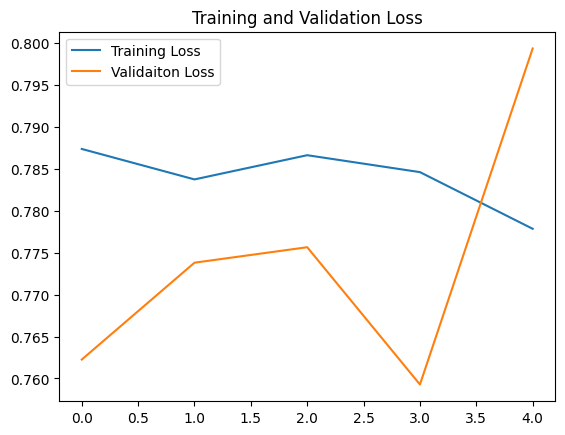

In [21]:
## Ploting the loss

loss = history['train_loss']
val_loss = history['val_loss']

epochs_range = range(len(loss))

plt.plot(epochs_range,loss,label='Training Loss')
plt.plot(epochs_range,val_loss,label="Validaiton Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

In [22]:
def test(model, path, device,threshold):
    model.to(device)
    model.eval()
    with torch.no_grad():
        for img_name in os.listdir(path):
            img = transforms.ToTensor()(Image.open(path + "/" + img_name).convert('RGB'))
            out = model([img.to(device)])
            keep = torchvision.ops.nms(out[0]['boxes'], out[0]['scores'], threshold)
            im = (img.permute(1,2,0).cpu().detach().numpy()*255).astype('uint8')
            vsample = Image.fromarray(im)
            draw = ImageDraw.Draw(vsample)
            for box in out[0]['boxes'][keep] :
                draw.rectangle(list(box), fill=None, width=3, outline='red')
            plt.figure(figsize=(10, 10))
            plt.axis(False)
            plt.imshow(vsample)
            plt.show()

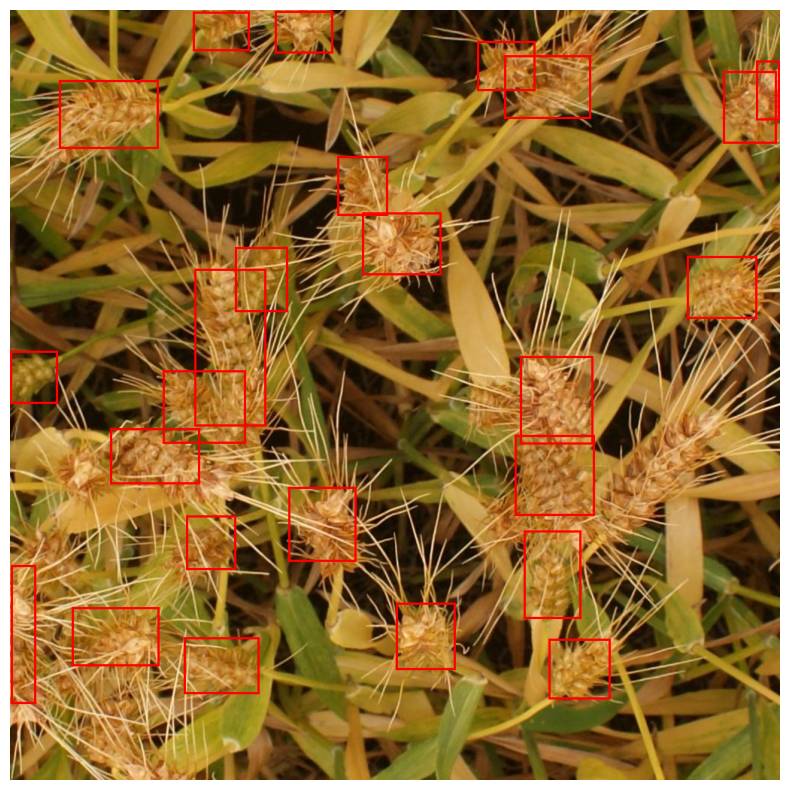

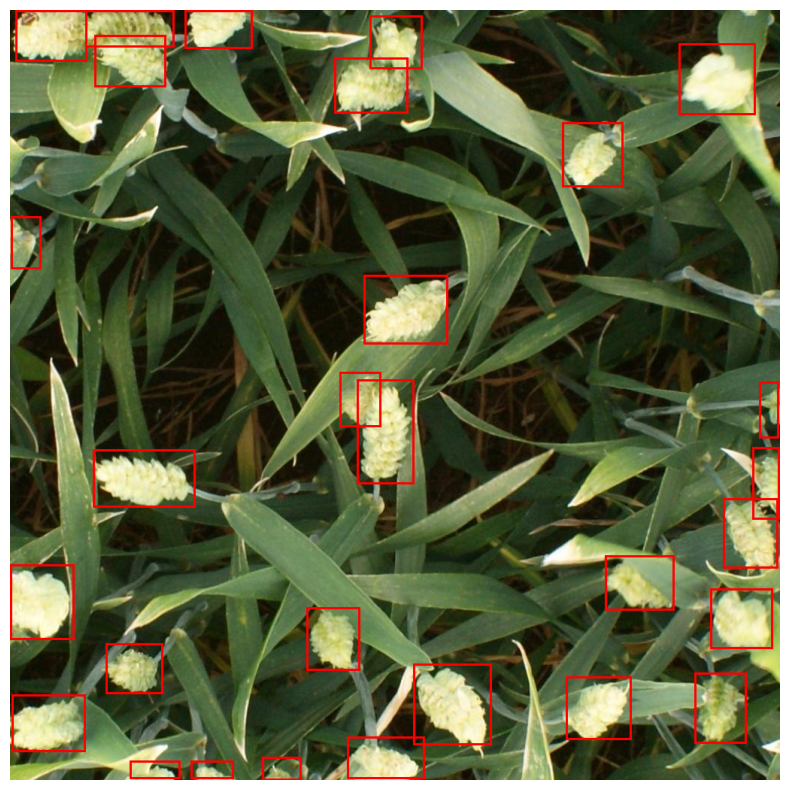

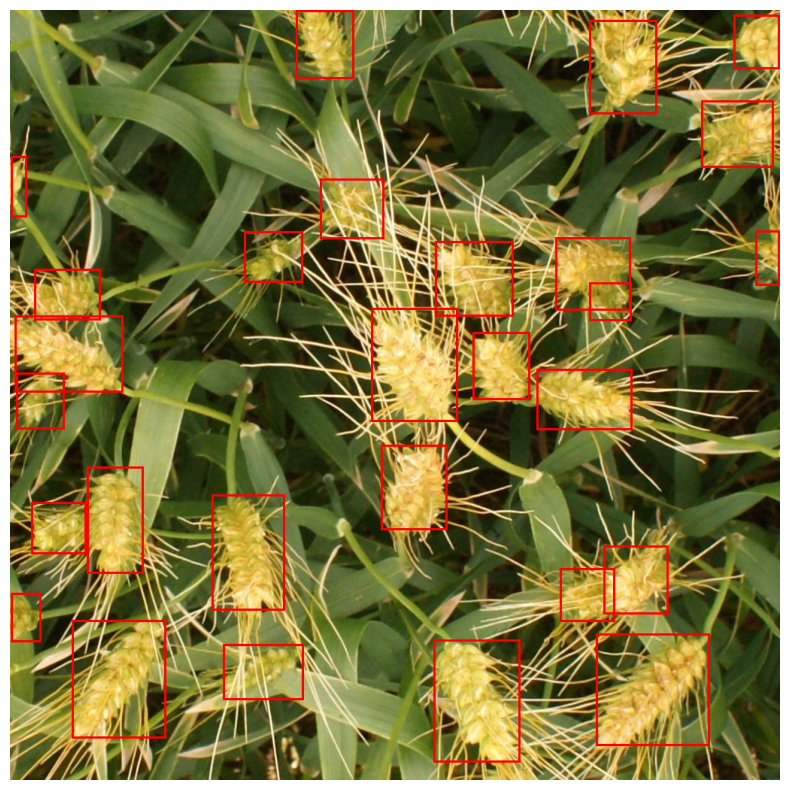

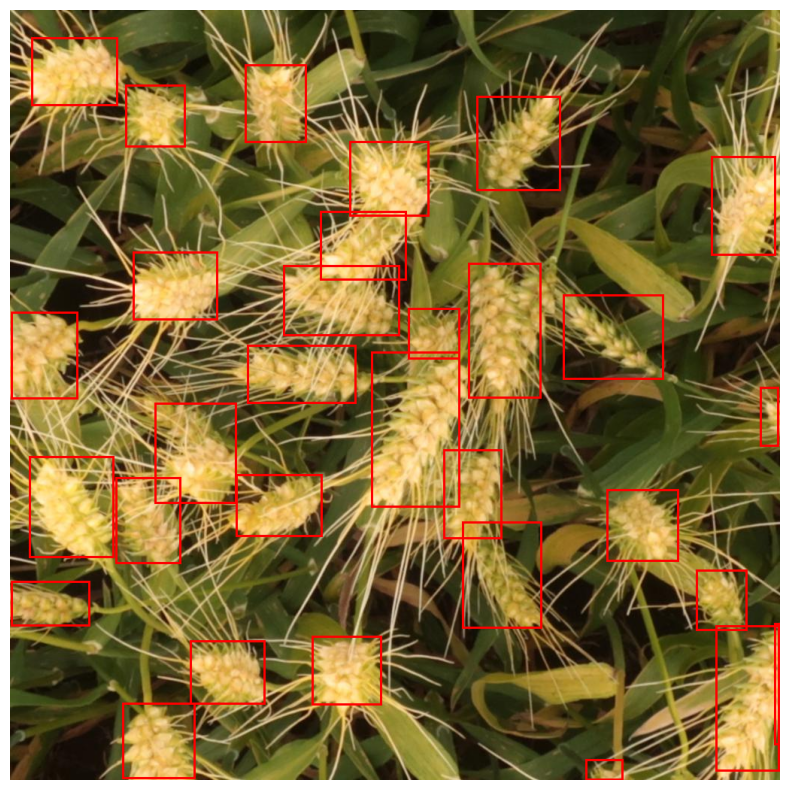

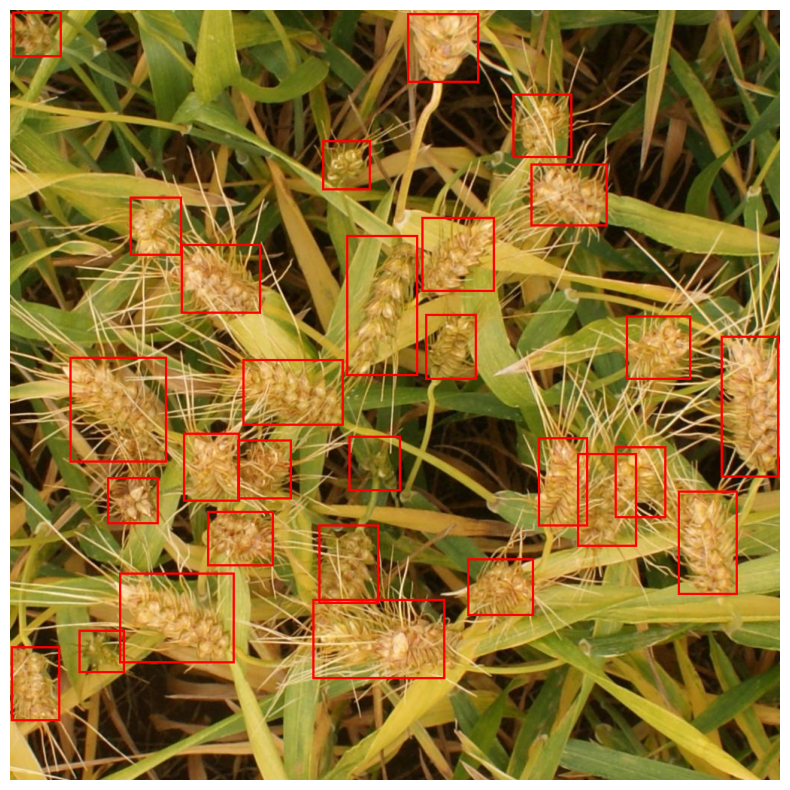

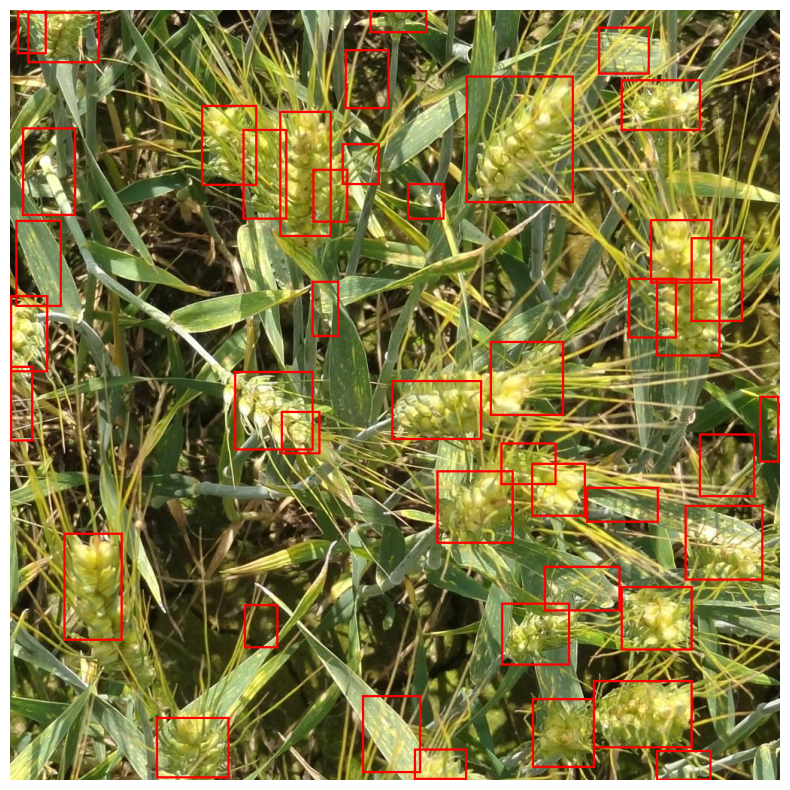

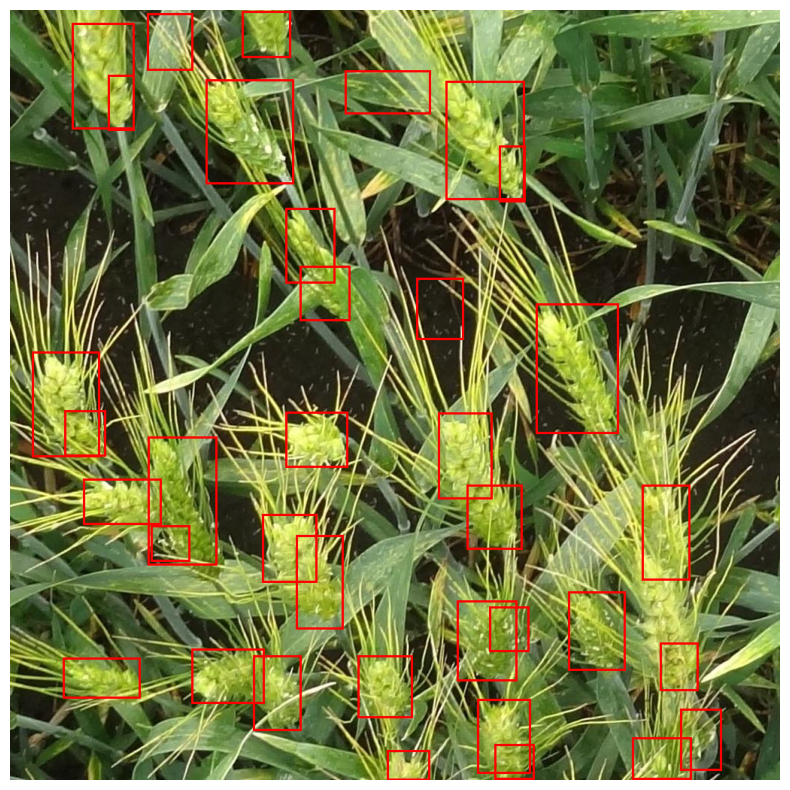

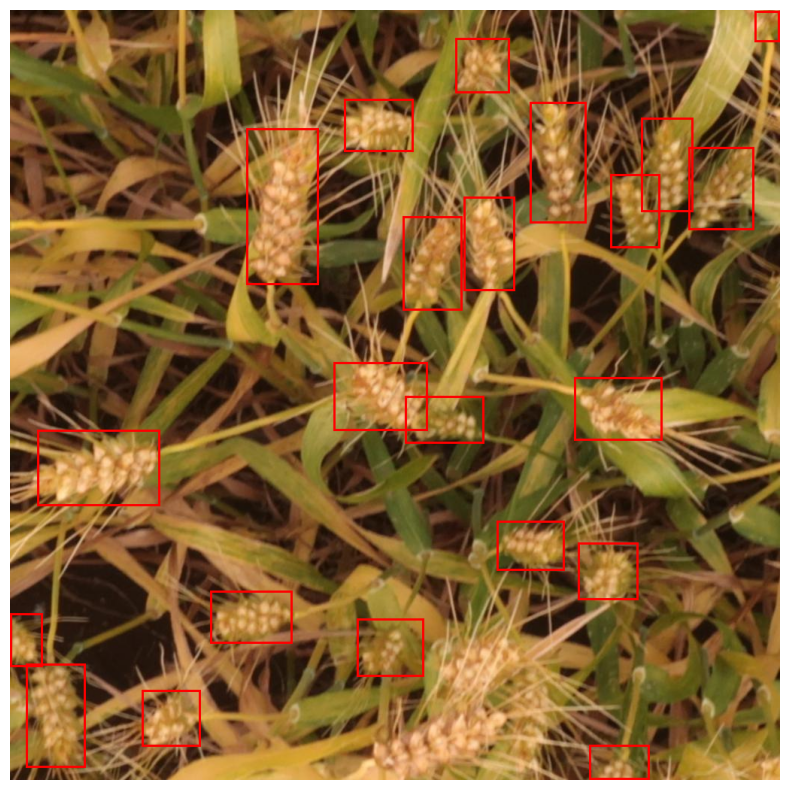

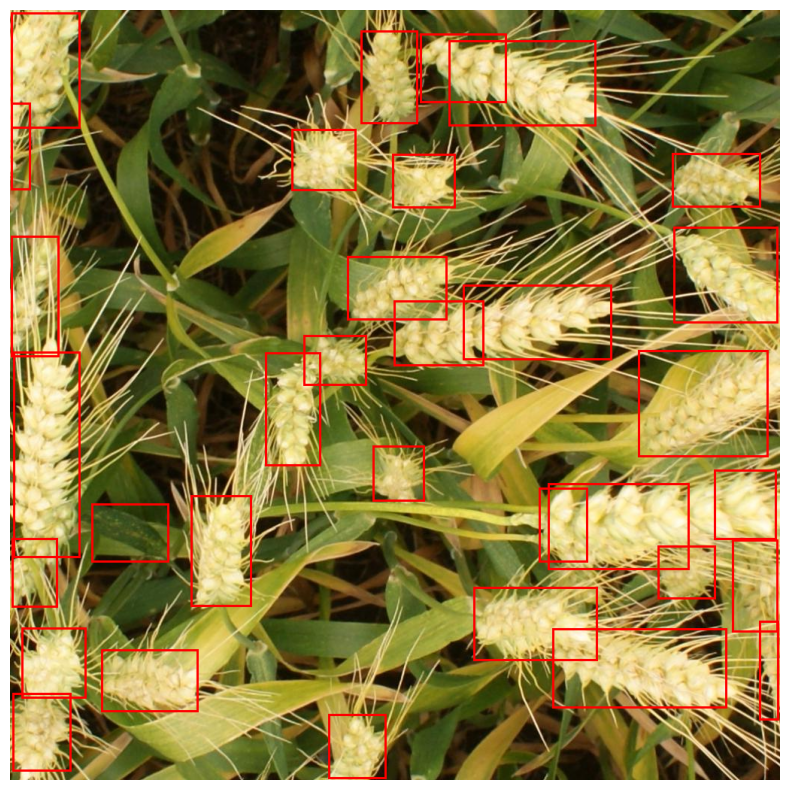

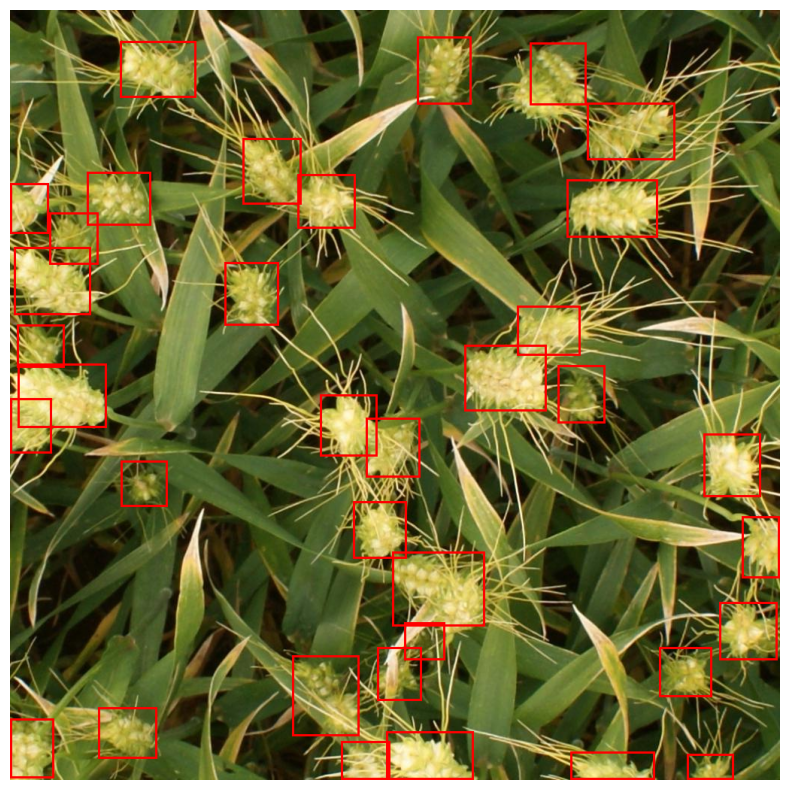

In [23]:
test(model, '/kaggle/input/global-wheat-detection/test', device, 0.25)